Proyecto de grado
Alumnos: Martinez, Luciano
         Rigotti, Matias

In [1]:
import tensorflow as tf
import helpers
import info
import regressionModel
import compareModels
from datetime import datetime
import pandas as pd

print(tf.__version__)

class Data(object):
    def __init__(self, x_train, x_test, y_train, y_test, y_test_pred= None):
        self.x_train = x_train
        self.x_test = x_test
        self.y_train = y_train
        self.y_test = y_test
        self.y_test_pred =  y_test_pred
        
  

print(tf.__version__)

2.7.0
2.7.0
2.7.0


In [2]:

# Con la base de datos ya preparada, la vamos a leer y luego asignar los nombres de las columnas.
dataSet = helpers.loadDataSet()

# Leer informacion básica de la base de datos.
info.initialInfo(dataSet)

'************************* tipo de variables *************************'

id                 int64
invoice           object
itemId            object
description       object
quantity           int64
invoiceDate       object
price            float64
customerId         int64
country           object
null              object
OrderQuantity    float64
dtype: object

'************************* Primeros pedidos del dataSet *************************'

,id,invoice,itemId,description,quantity,invoiceDate,price,customerId,country,null,OrderQuantity
0,1,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,1/12/2009 07:45,6.95,13085,United Kingdom,NaN,NaN
1,2,489434,79323P,PINK CHERRY LIGHTS,12,1/12/2009 07:45,6.75,13085,United Kingdom,NaN,NaN
2,3,489434,79323W,WHITE CHERRY LIGHTS,12,1/12/2009 07:45,6.75,13085,United Kingdom,NaN,NaN
3,4,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,1/12/2009 07:45,2.10,13085,United Kingdom,NaN,NaN
4,5,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,1/12/2009 07:45,1.25,13085,United Kingdom,NaN,NaN


'************************* Ultimos pedidos del dataSet'

,id,invoice,itemId,description,quantity,invoiceDate,price,customerId,country,null,OrderQuantity
824357,932285,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,9/12/2011 12:50,0.85,12680,France,NaN,NaN
824358,932286,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,9/12/2011 12:50,2.10,12680,France,NaN,NaN
824359,932287,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,9/12/2011 12:50,4.15,12680,France,NaN,NaN
824360,932288,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,9/12/2011 12:50,4.15,12680,France,NaN,NaN
824361,932289,581587,22138,BAKING SET 9 PIECE RETROSPOT,3,9/12/2011 12:50,4.95,12680,France,NaN,NaN


'************************* Primer pedido fue el :'

datetime.date(2009, 1, 12)

'************************* Ultimo pedido fue el :'

datetime.date(2011, 12, 10)

' ************************* Lapso de periodo del dataSet es de'

datetime.timedelta(days=1062)

In [3]:
# Aplicamos filtros necesarios a la base de datos para hacer una primera limpieza.
dataSet = helpers.filterDataSet(dataSet)

'Devoluciones de pedidos'

,id,invoice,itemId,description,quantity,invoiceDate,price,customerId,country,null,OrderQuantity
178,179,C489449,22087,PAPER BUNTING WHITE LACE,-12,2009-01-12 10:33:00,2.95,16321,Australia,NaN,NaN
179,180,C489449,85206A,CREAM FELT EASTER EGG BASKET,-6,2009-01-12 10:33:00,1.65,16321,Australia,NaN,NaN
180,181,C489449,21895,POTTING SHED SOW 'N' GROW SET,-4,2009-01-12 10:33:00,4.25,16321,Australia,NaN,NaN
181,182,C489449,21896,POTTING SHED TWINE,-6,2009-01-12 10:33:00,2.10,16321,Australia,NaN,NaN
182,183,C489449,22083,PAPER CHAIN KIT RETRO SPOT,-12,2009-01-12 10:33:00,2.95,16321,Australia,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
823910,931838,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,2011-09-12 09:57:00,0.83,14397,United Kingdom,NaN,NaN
823994,931922,C581499,M,Manual,-1,2011-09-12 10:28:00,224.69,15498,United Kingdom,NaN,NaN
824168,932096,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,2011-09-12 11:57:00,10.95,15311,United Kingdom,NaN,NaN
824169,932097,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,2011-09-12 11:58:00,1.25,17315,United Kingdom,NaN,NaN


c:\Users\Luciano\Documents\PDG\repos\PDG-Python\helpers.py:71: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  return dataSet[~negativeQuantity]


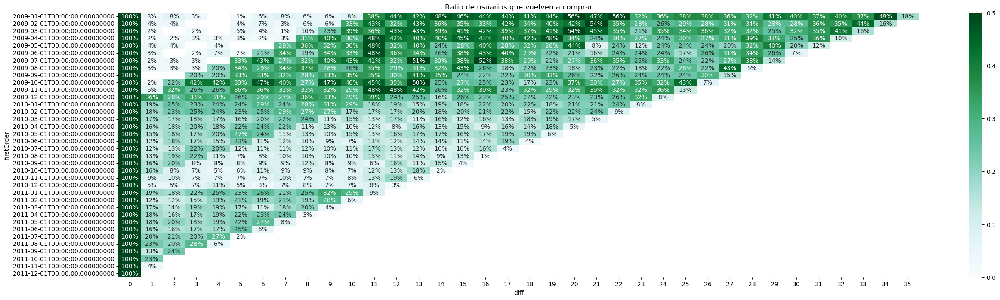

In [4]:
# Análisis de cohort
helpers.cohortAnalysis(dataSet)
# ## TODO Sacar un analisis del cohortToPlot !!!!!!!!!!!!!!!!!!!

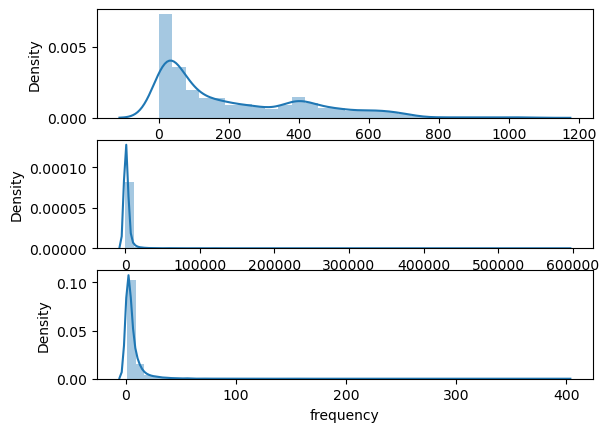

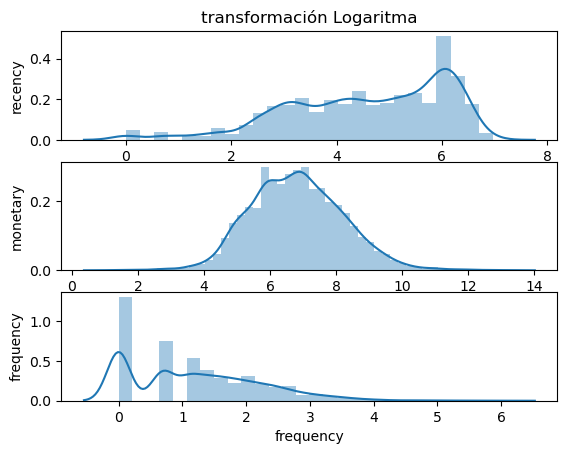

In [5]:
# Calculamos los valores de RMF
rmf, rmfDataLog = helpers.calculateRMF(dataSet)

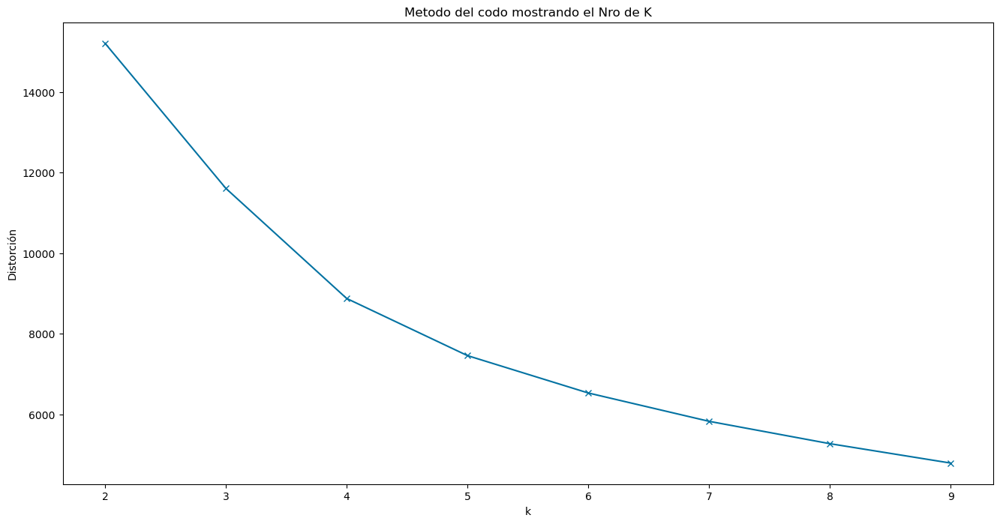

In [6]:
# Graficamos el metodo del Codo para obtener la cantidad adecuada de numero de clusters (k)
#https://machinelearningparatodos.com/segmentacion-utilizando-k-means-en-python/#:~:text=El%20m%C3%A9todo%20del%20codo%20utiliza,las%20observaciones%20a%20su%20centroide.&text=Cuanto%20menor%20es%20la%20distancia,la%20distancia%20media%20intra%2Dcluster.

info.showElbowMethod(rmfDataLog)

For n_clusters = 2, silhouette score is 0.4346667518033746)
For n_clusters = 3, silhouette score is 0.334198520155398)
For n_clusters = 4, silhouette score is 0.3622891898848039)
For n_clusters = 5, silhouette score is 0.3330630448074621)
For n_clusters = 6, silhouette score is 0.32864144692894265)
For n_clusters = 7, silhouette score is 0.33389352214431295)
For n_clusters = 8, silhouette score is 0.2942221871955572)
For n_clusters = 9, silhouette score is 0.2909490225441946)


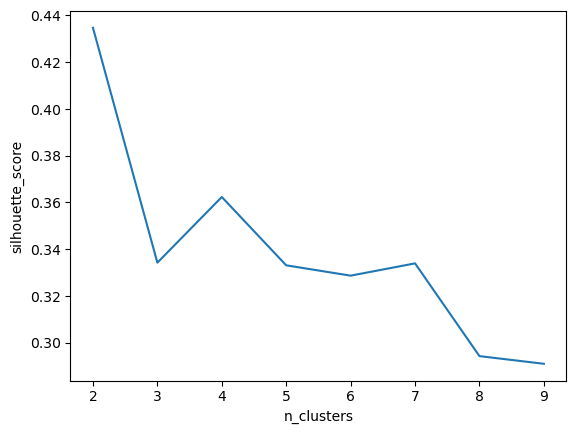

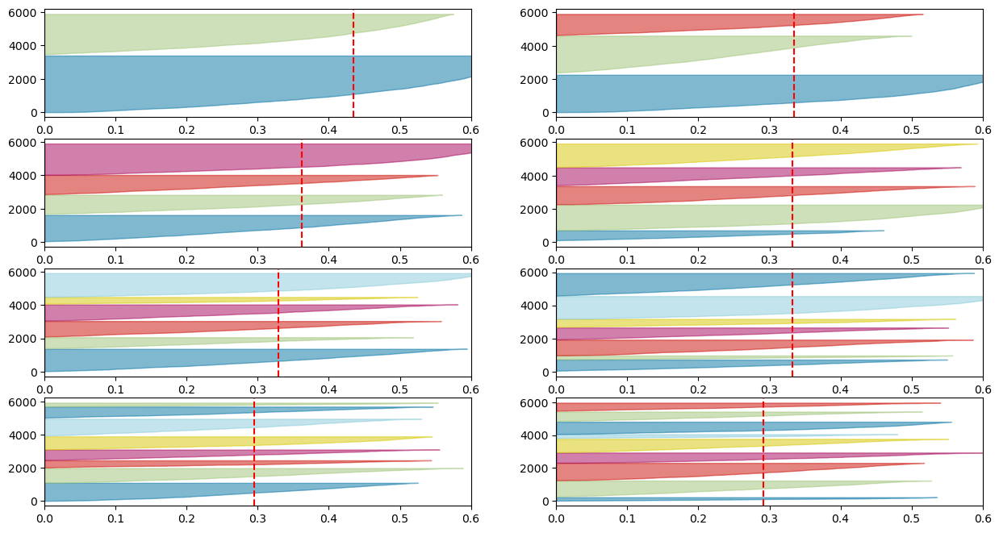

In [7]:

# Con este método no nos fue suficiente, procederemos a hacer el metodo de la silueta


helpers.calcuteSilhouetteMethod(rmfDataLog)

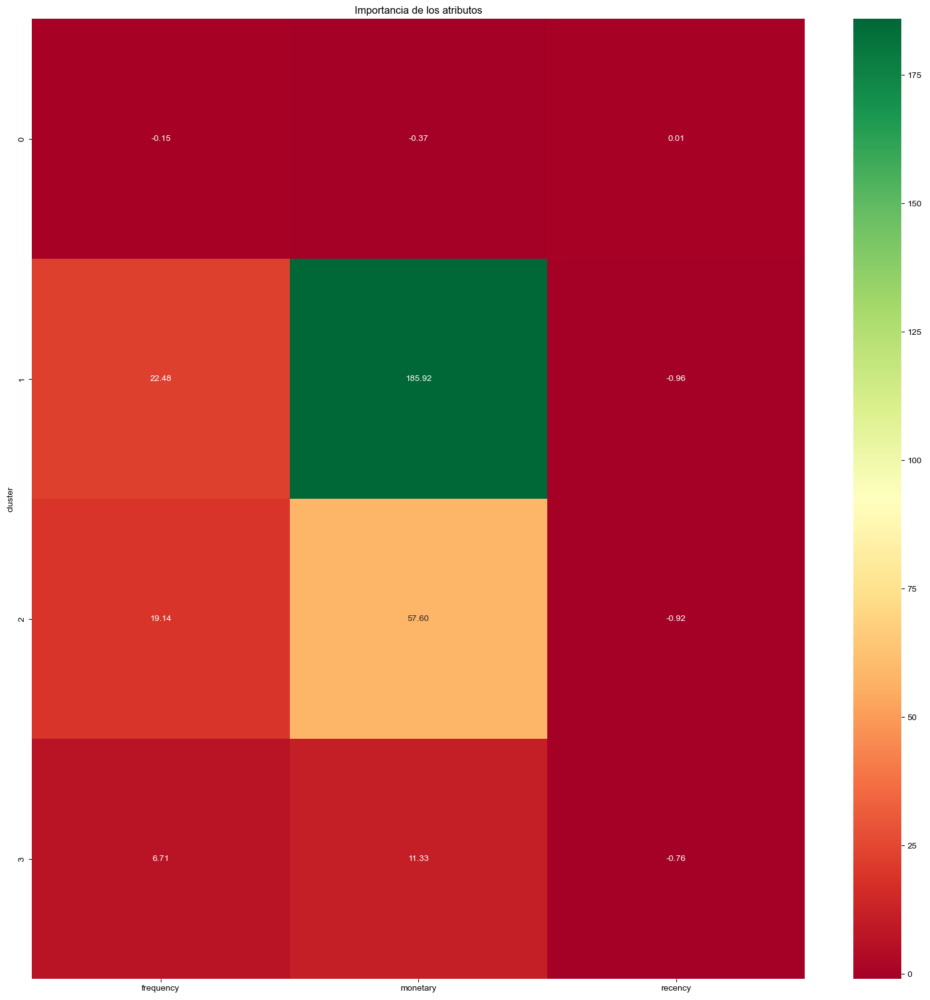

In [8]:
# TODO análisis - Luego del analisis, vamos a usar el nro de cluster igual a 4.
# entrenamos con el metodo k-means agrupando 
rmf, clustersData = helpers.calculateKmeans(rmf)
## TODO Guardar esta variable clustersData en el documento

# Mostramos en un gráfico la importancia de cada Cluster con respecto al rmf
info.showClusterImportance(rmf)

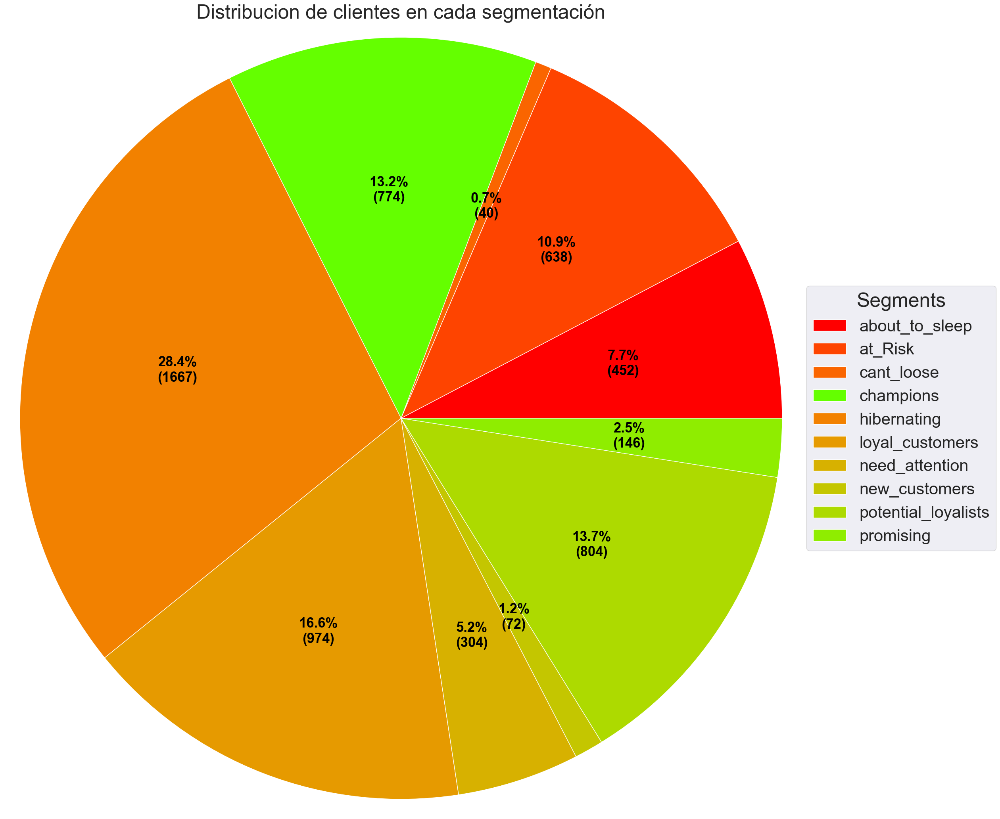

In [9]:

'''
Otro analisis de los clientes que podemos realizar es el analisis 
de la sumatoria de la frecuencia y el valor monetario con respecto a la 
recencia.
'''

# Evaluaremos para cada cliente su segmentación.
rfm = helpers.addSegmentations(rmf)

# Graficamos todas las segmentación de los clientes.
info.showSegmentation(rfm)

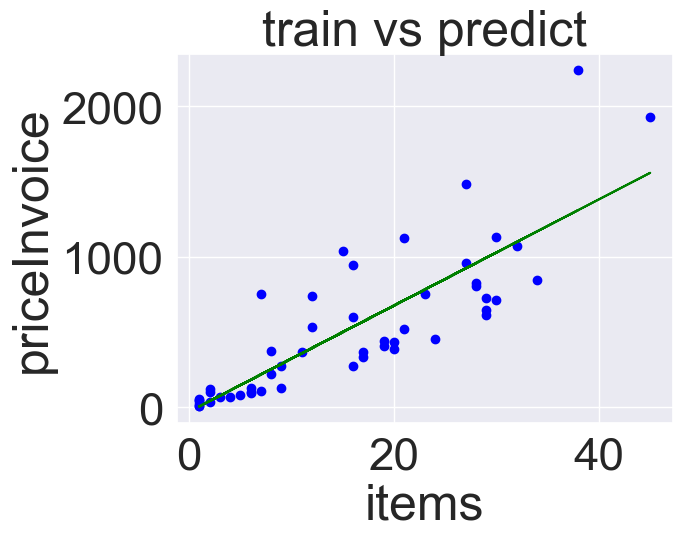

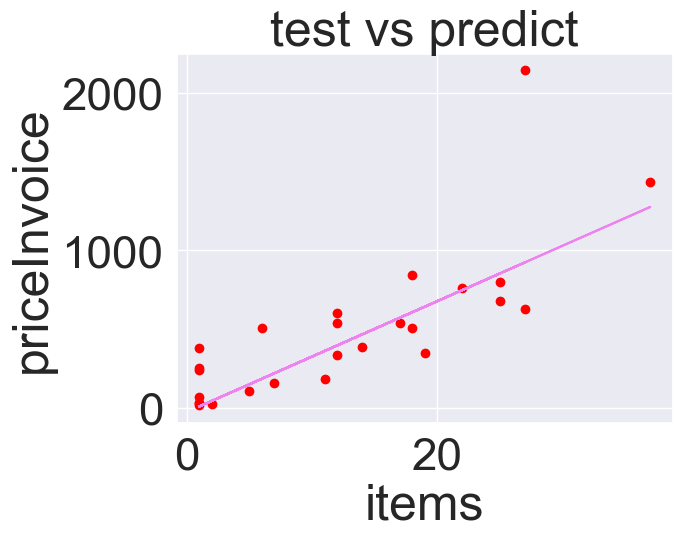

*************** Métricas ***************
MAE 179.72170840763408
MSE 87346.17228193798
RMSE 295.54385847440307
R2 0.6174697194790886


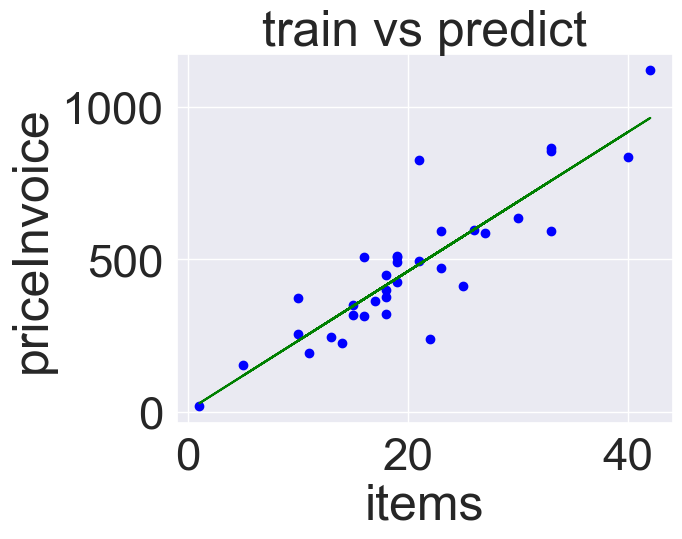

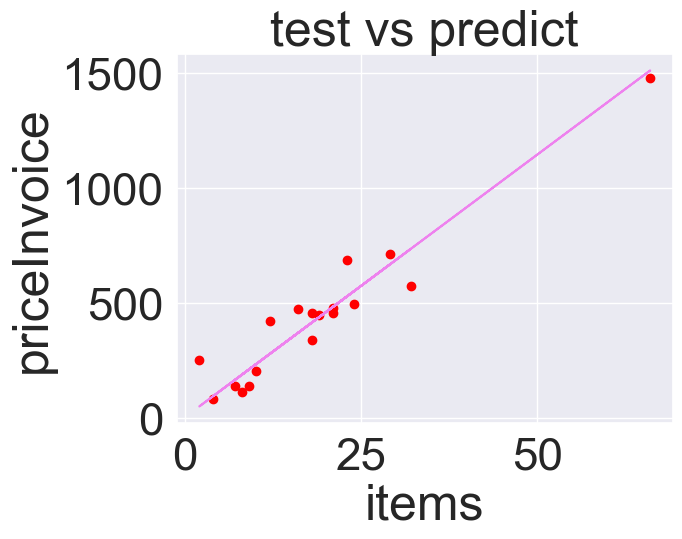

*************** Métricas ***************
MAE 70.94428090327983
MSE 8318.860717922646
RMSE 91.20778869111258
R2 0.9152955633907911


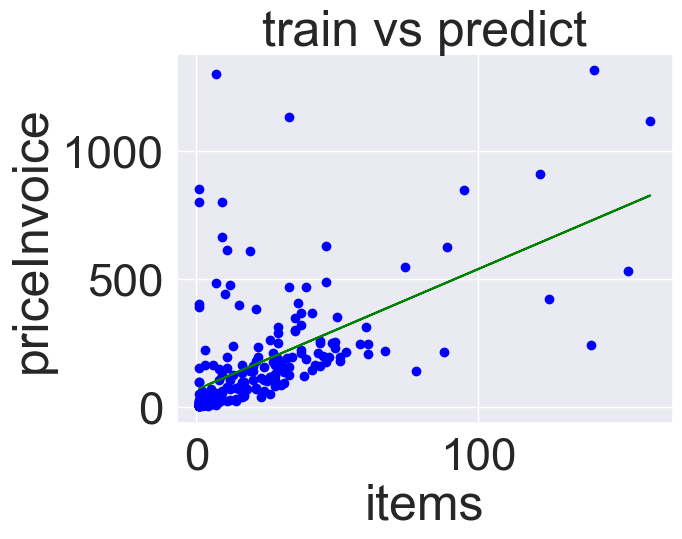

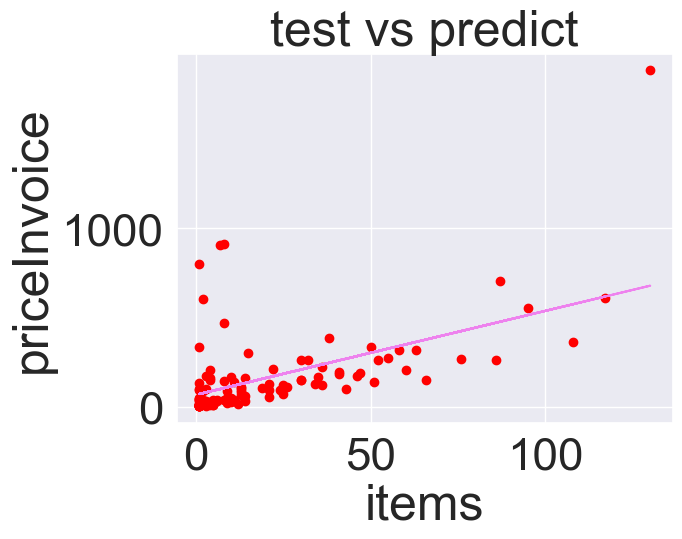

*************** Métricas ***************
MAE 109.5179501514942
MSE 40384.32452211166
RMSE 200.95851443049548
R2 0.3313734524179559


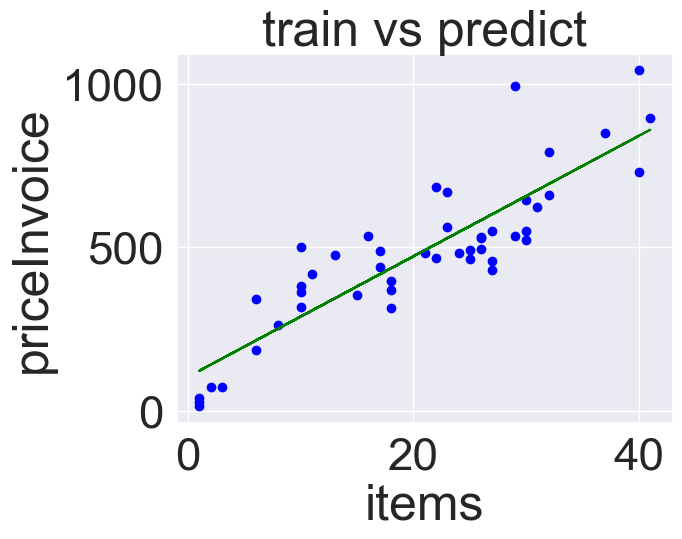

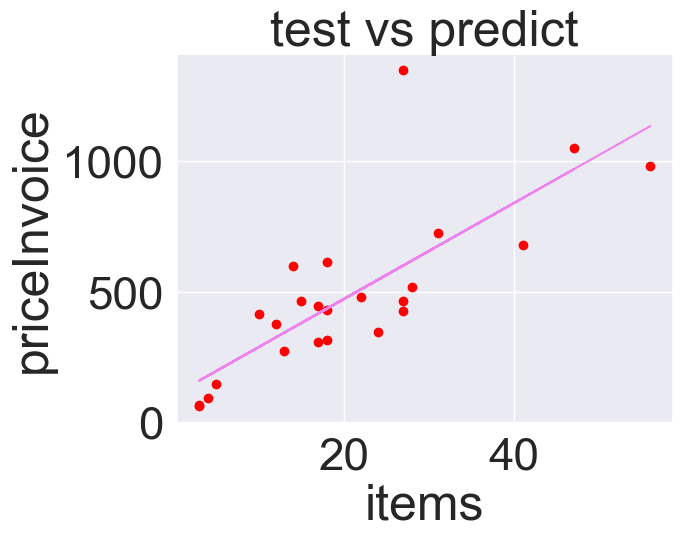

*************** Métricas ***************
MAE 133.44578151270392
MSE 37525.874145195274
RMSE 193.71596254618584
R2 0.5939251729558451


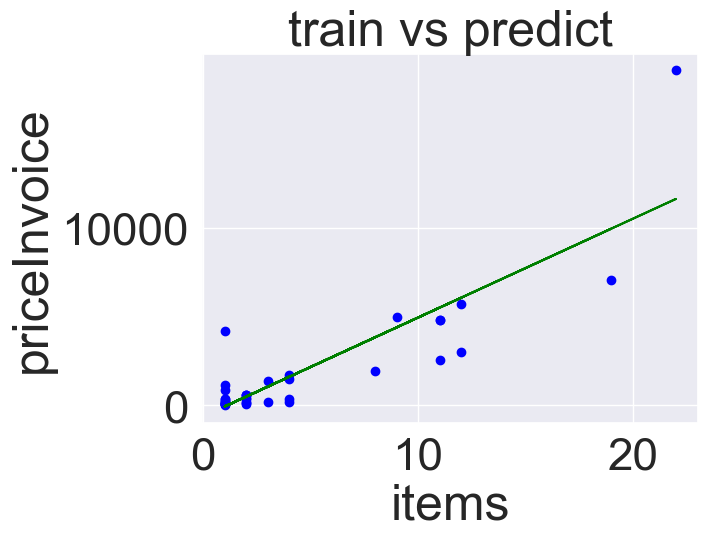

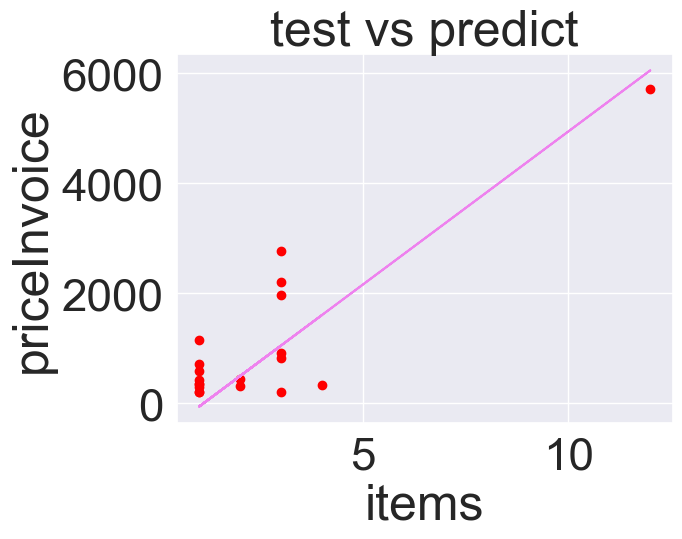

*************** Métricas ***************
MAE 613.2932406793196
MSE 578384.6013447574
RMSE 760.5160099200788
R2 0.7137092959473907


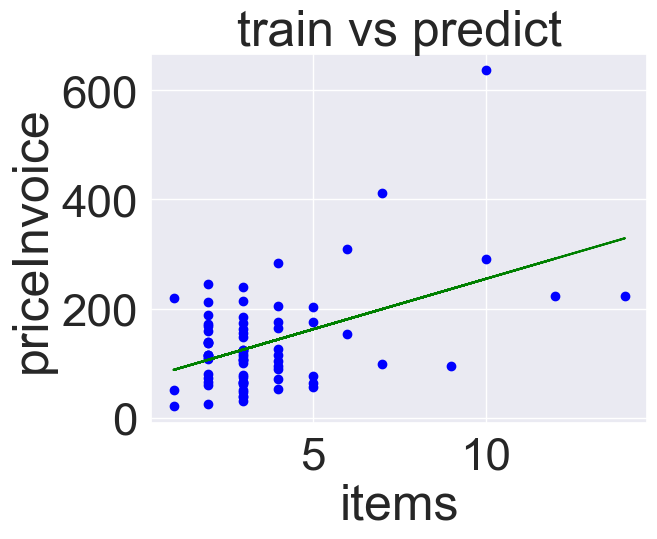

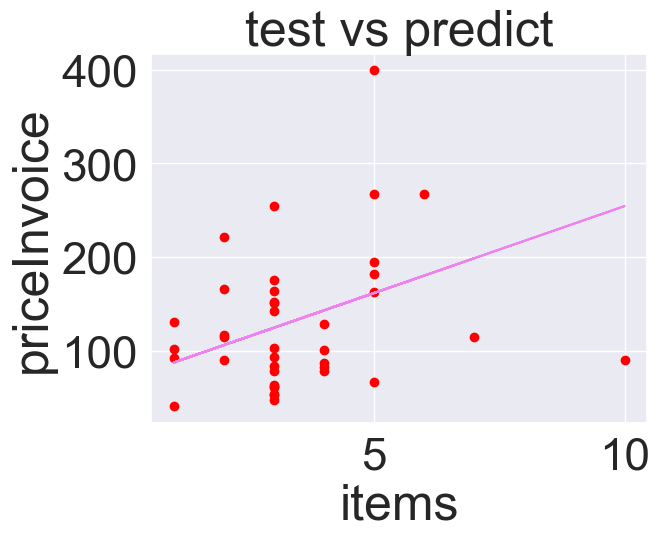

*************** Métricas ***************
MAE 57.057515193610016
MSE 5395.0413896461305
RMSE 73.45094546461694
R2 0.013451359636954652


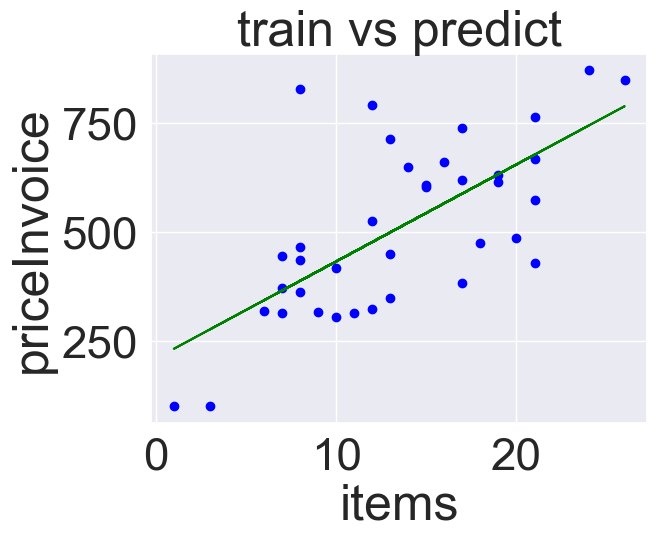

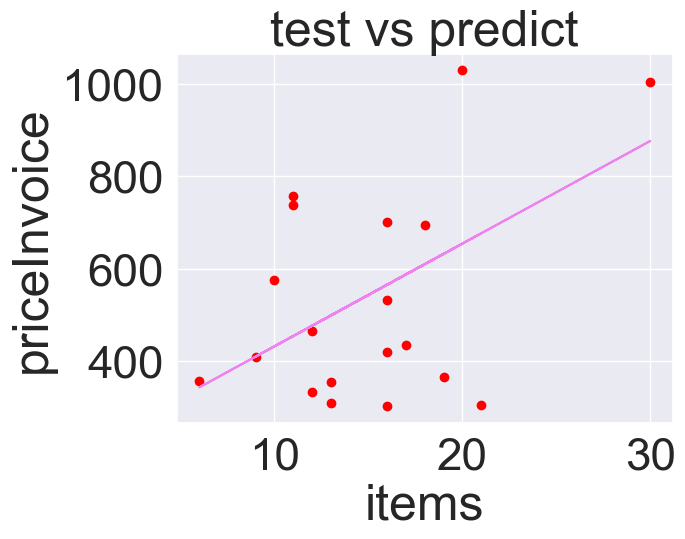

*************** Métricas ***************
MAE 167.4723386659675
MSE 40744.554522731196
RMSE 201.85280409925247
R2 0.18226826314240563


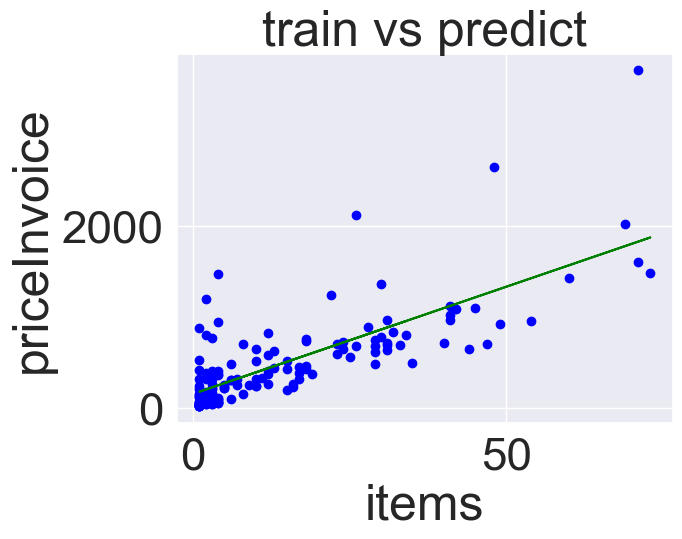

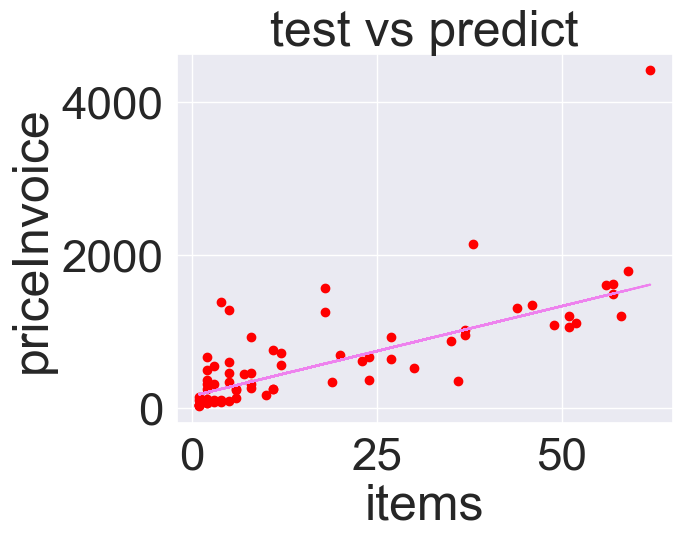

*************** Métricas ***************
MAE 272.3007456660651
MSE 230394.23098912637
RMSE 479.9939905760554
R2 0.5329358380752629


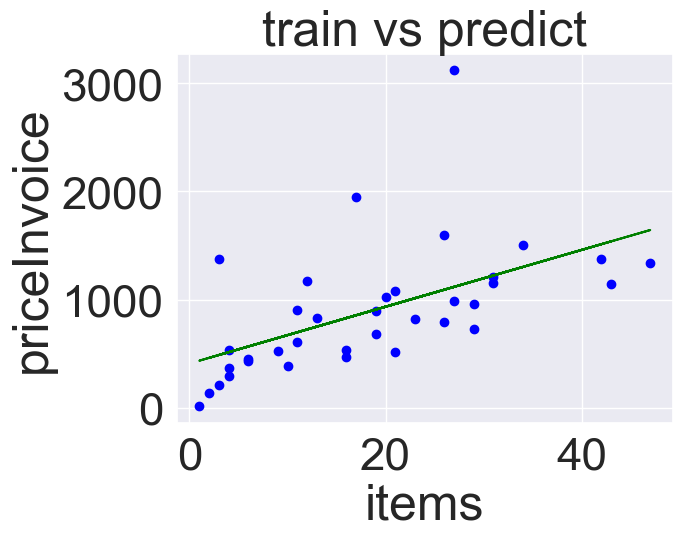

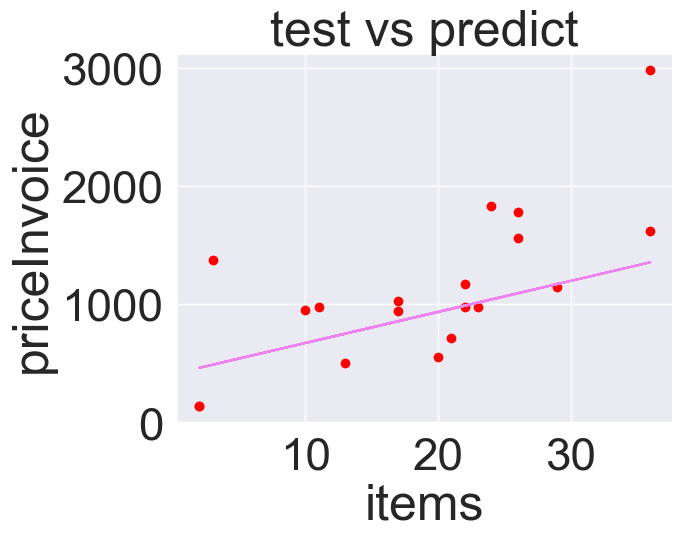

*************** Métricas ***************
MAE 385.09621875719006
MSE 290417.9878832226
RMSE 538.9044329778914
R2 0.40990964444788847


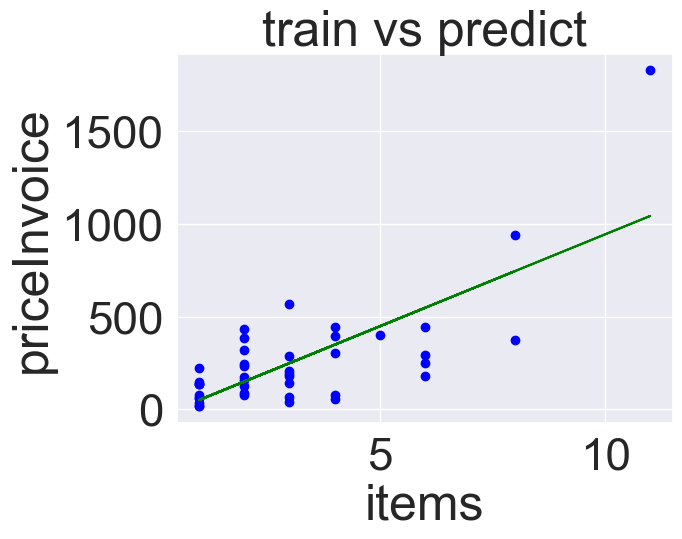

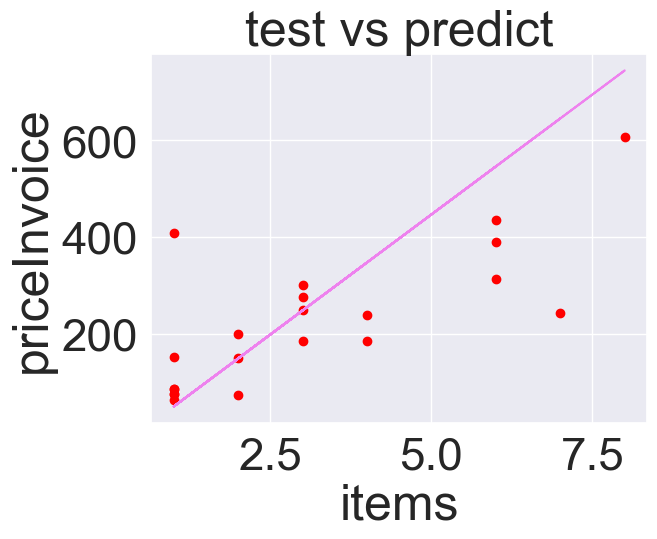

*************** Métricas ***************
MAE 103.72771592977513
MSE 22272.804557272168
RMSE 149.2407603748794
R2 -0.07110854716569248


In [10]:


# predecir proximo pedido


"""
Para un determinado cliente, vamos a aplicar un modelo de regresion lineal.
sobre la cantidad de items vs precio de la factura.
"""
df, clients = helpers.getGroupByInvoiceClients(dataSet)
helpers.singleRegressionLineal(df, clients)


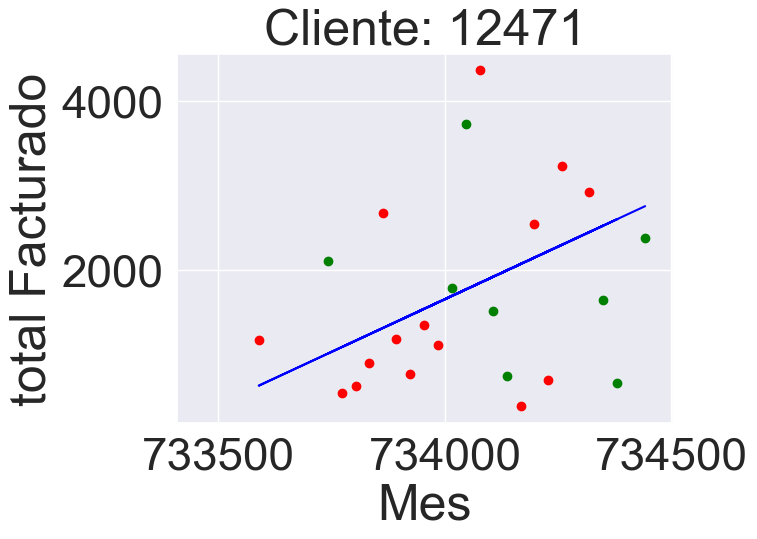

*************** Métricas ***************
MAE 1000.0747100797144
MSE 1431145.4796632733
RMSE 1196.3049275428373
R2 -0.6679474870103241


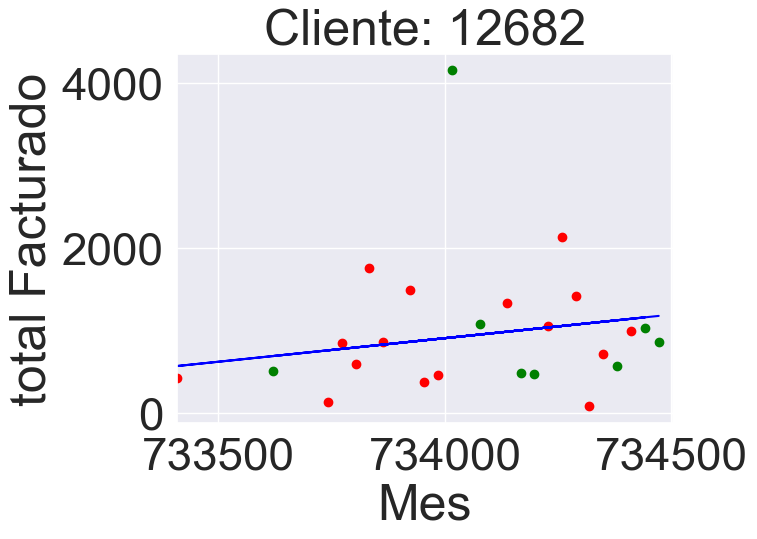

*************** Métricas ***************
MAE 701.3589759340362
MSE 1437918.9334725414
RMSE 1199.13257543632
R2 -0.05499863034722985


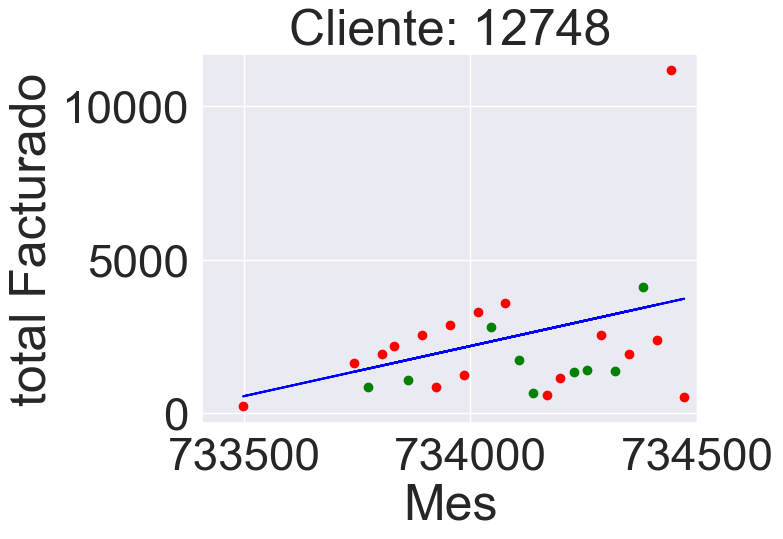

*************** Métricas ***************
MAE 1138.0729281890349
MSE 1620822.2211313641
RMSE 1273.1151641274894
R2 0.20801219202520926


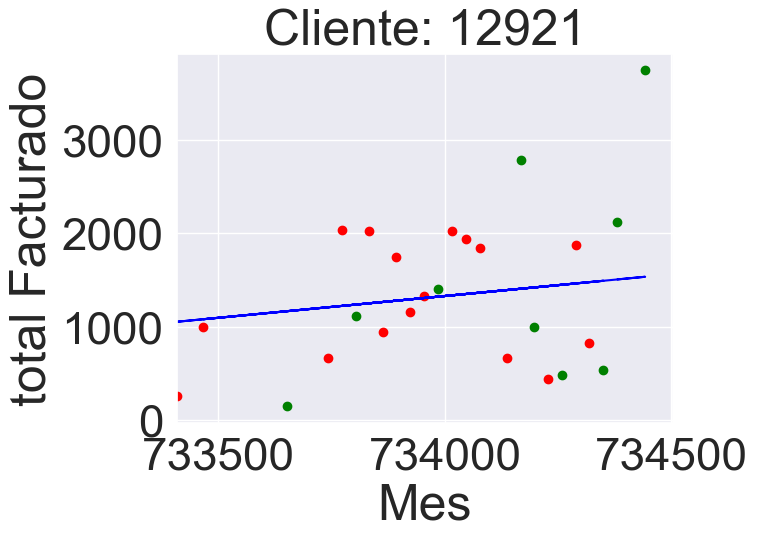

*************** Métricas ***************
MAE 862.825777006983
MSE 1137683.2571589558
RMSE 1066.6223592063668
R2 0.09780676220964823


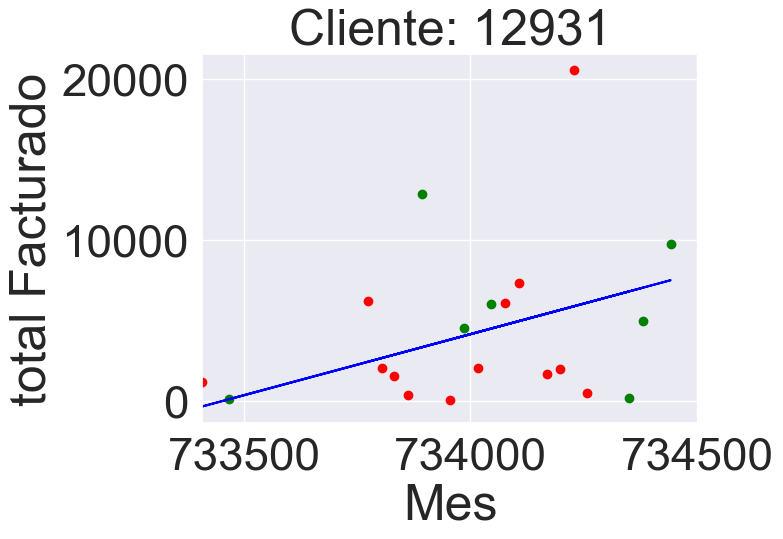

*************** Métricas ***************
MAE 3209.450378067328
MSE 20838122.770544972
RMSE 4564.879272285848
R2 -0.08943599633794075


In [11]:

"""
Con la información obtenida hasta el momento, intentaremos crear una 
regresión lineal para los principales clientes
considerando el total de lo facturado a un cliente en un mes calendario.
Se convierte los datos de los meses en formato de calendario gregoriano que es numerico
así se puede entrenar el modelo.
"""

helpers.singleRegressionLinealByMonth(df, clients)


In [12]:
"""
Aplicaremos regresion lineal a cada pedido con el fin de predecir algunas cosas
Variedad de productos en el pedido
Precio total de la factura
Cantidad de productos totales.
"""



groupByInvoice = helpers.groupByInvoice(dataSet)

# TODO agregar estadisticas de % abarcado https://es.wikipedia.org/wiki/Desviaci%C3%B3n_t%C3%ADpica
# Desigualdad de Chebyshov
# TODO hacer análisis de lo siguiente.

NO pepe


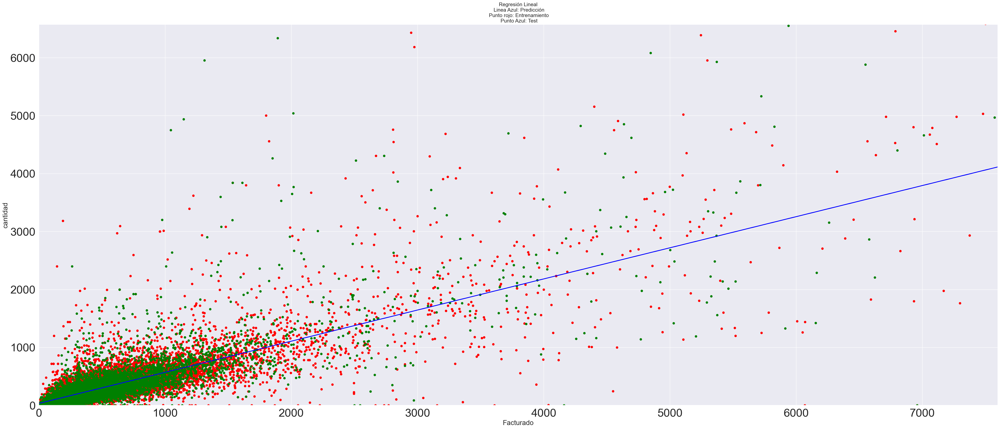

*************** Métricas ***************
MAE 128.9838213337343
MSE 808784.2098107853
RMSE 899.3243073612463
R2 0.4763284691178711
NO pepe


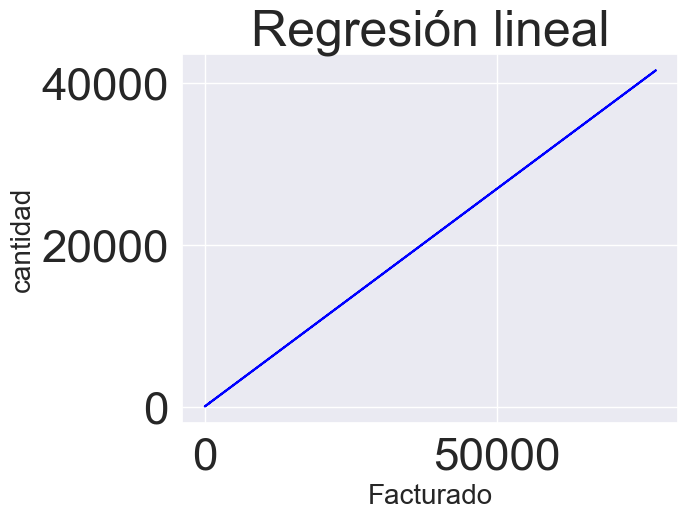

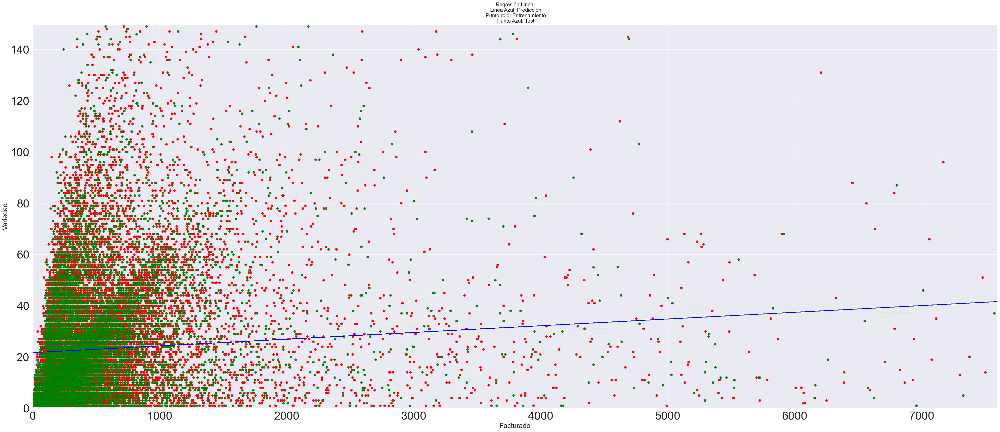

*************** Métricas ***************
MAE 16.184927210515117
MSE 620.9144542859904
RMSE 24.91815511401256
R2 0.03384299308019967
NO pepe


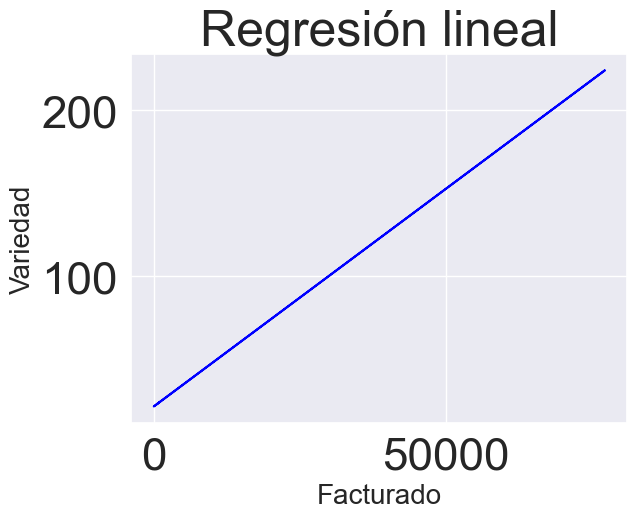

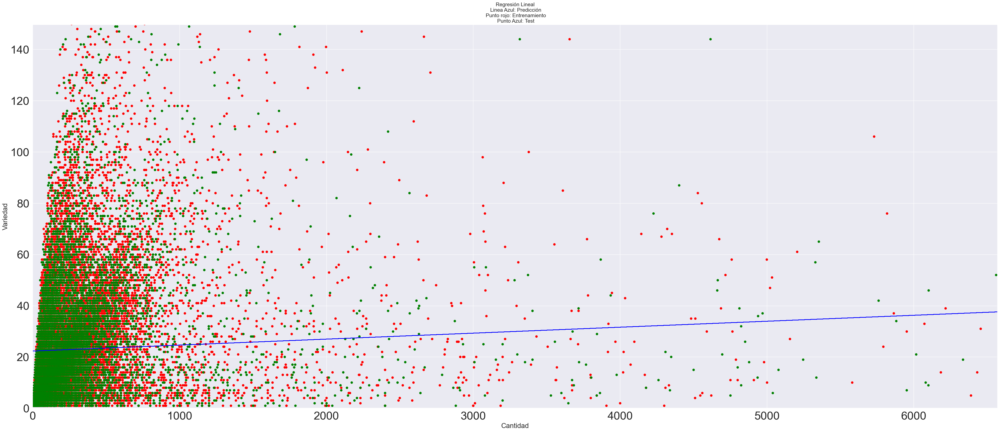

*************** Métricas ***************
MAE 16.33978869964031
MSE 633.9694025872213
RMSE 25.178749027448152
R2 0.01352517684137955
pepe


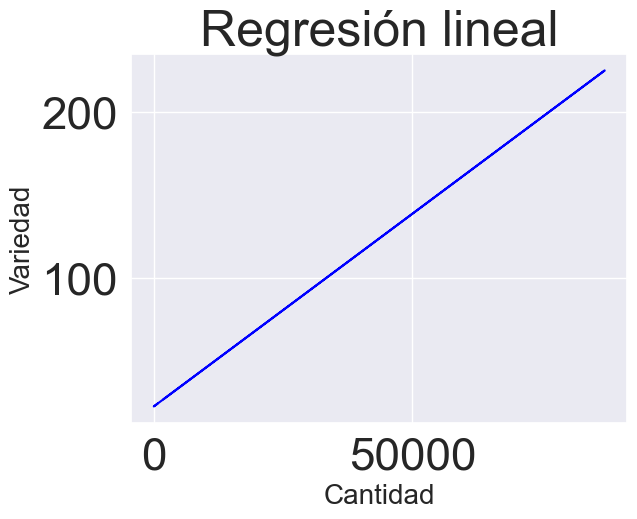

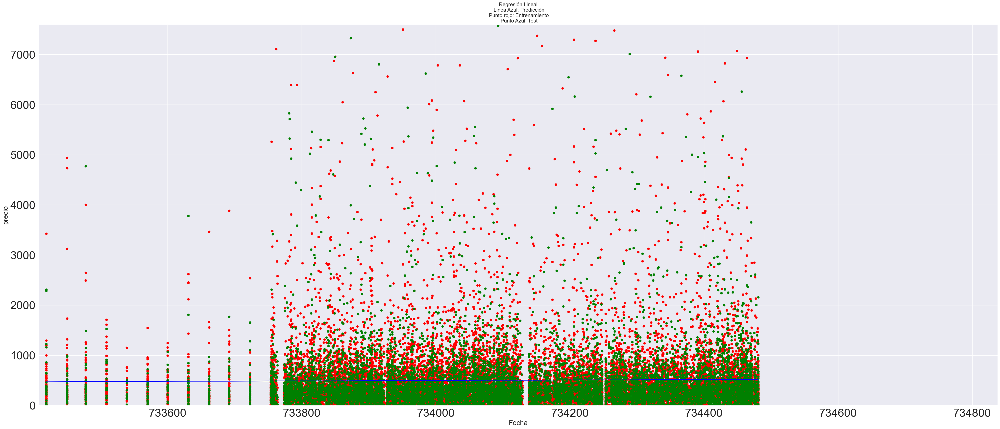

*************** Métricas ***************
MAE 395.6465485714266
MSE 1561458.3475505162
RMSE 1249.583269554501
R2 4.070985869775168e-05
pepe


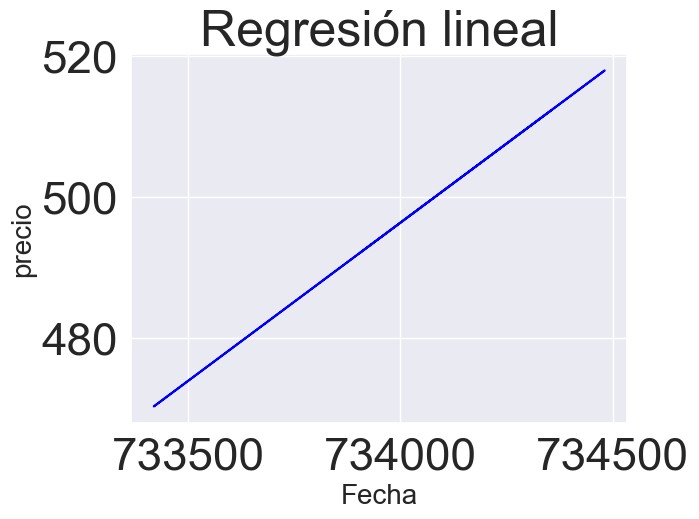

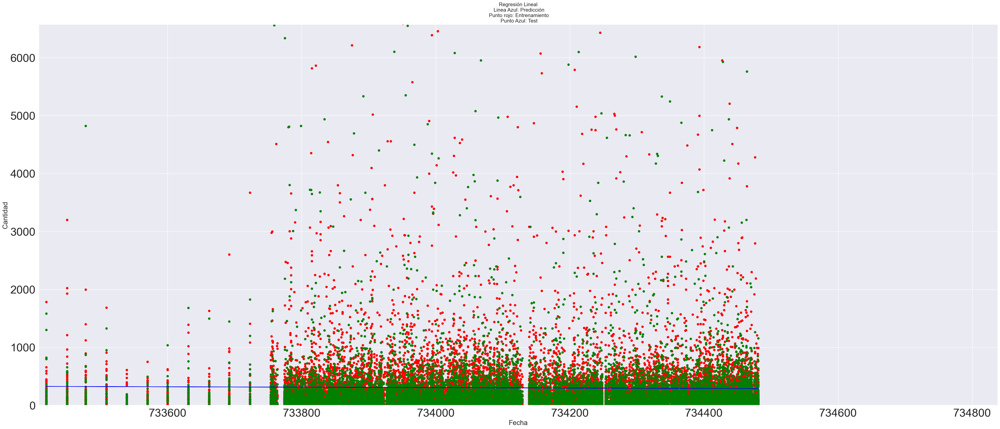

*************** Métricas ***************
MAE 270.2179390605695
MSE 1544493.220980661
RMSE 1242.7764163278368
R2 -7.2147965555213744e-06
pepe


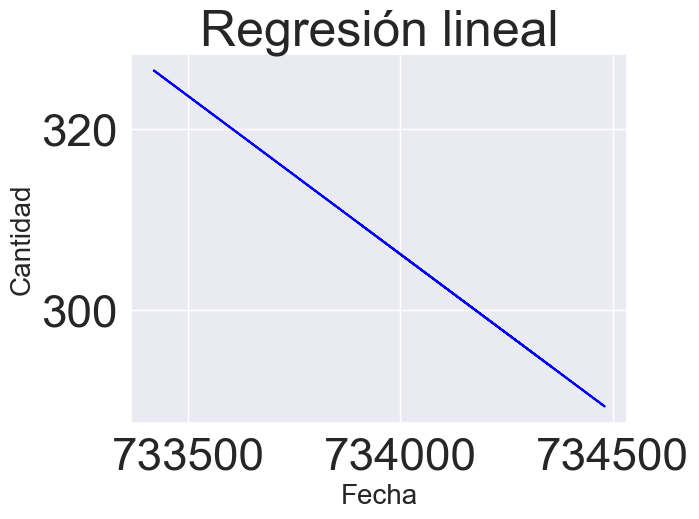

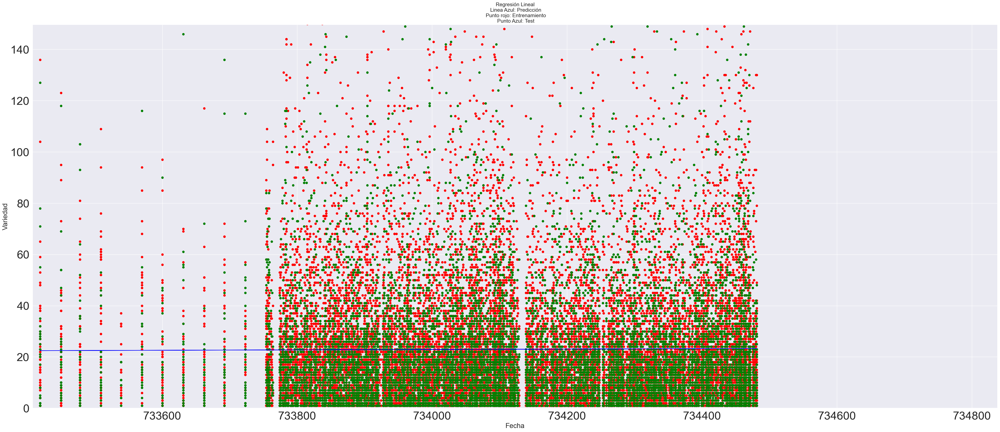

*************** Métricas ***************
MAE 16.52717270815682
MSE 642.489773680962
RMSE 25.34738198869781
R2 0.0002554221678294777


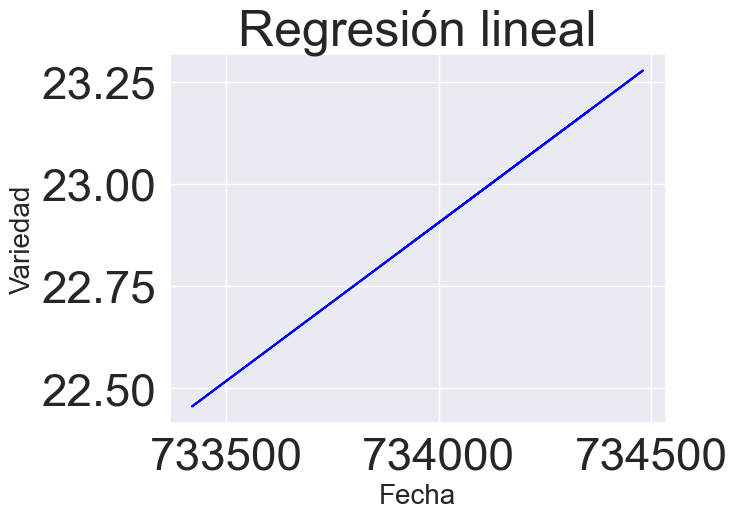

In [13]:
"""
Realizamos algunas predicciones lineales.


"""
helpers.runLinealPredictions(groupByInvoice)

In [14]:


segmentation = rmf 




"""# **Data Splitted into Training, Validation, Test**"""
"""
Preparamos los datos para correr entrenar el modelo de tensorFlow
"""

df, features, value = helpers.prepareDataToRegression(df, segmentation)


Epoch 1/500
5/5 [==============================] - 0s 30ms/step - loss: 1880.9077 - val_loss: 1350.0131
Epoch 2/500
5/5 [==============================] - 0s 8ms/step - loss: 1174.7429 - val_loss: 318.4835
Epoch 3/500
5/5 [==============================] - 0s 7ms/step - loss: 623.5285 - val_loss: 598.8567
Epoch 4/500
5/5 [==============================] - 0s 7ms/step - loss: 441.0175 - val_loss: 560.3647
Epoch 5/500
5/5 [==============================] - 0s 8ms/step - loss: 424.8926 - val_loss: 408.8956
Epoch 6/500
5/5 [==============================] - 0s 8ms/step - loss: 370.0258 - val_loss: 342.1268
Epoch 7/500
5/5 [==============================] - 0s 8ms/step - loss: 347.4499 - val_loss: 295.4380
Epoch 8/500
5/5 [==============================] - 0s 7ms/step - loss: 310.3989 - val_loss: 292.4912
Epoch 9/500
5/5 [==============================] - 0s 8ms/step - loss: 299.7557 - val_loss: 292.1876
Epoch 10/500
5/5 [==============================] - 0s 8ms/step - loss: 293.1059 - val_

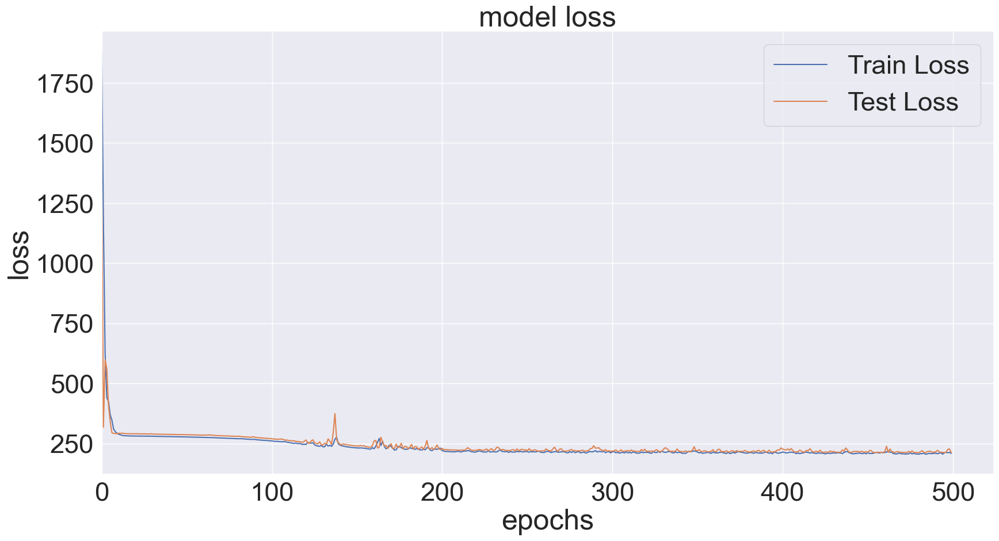

*************** Métricas ***************
MAE 207.12367205546926
MSE 291122.5425979082
RMSE 539.5577286981517
R2 0.32518247897588026


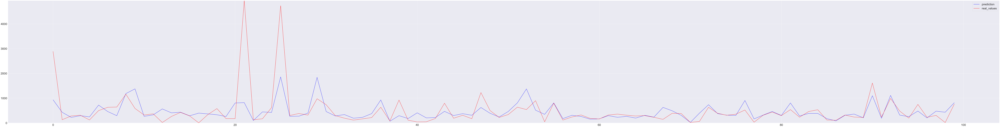

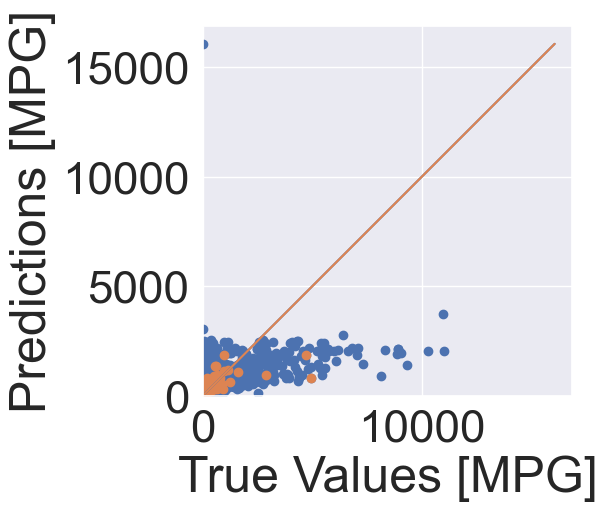

In [25]:
## predecir todos clientes **********************************************
## R2 0.41860542944866796
data, modelCreated = regressionModel.runPrediction(df, features, value)
#joblib.dump(logreg, "./modelTrained/regressionModel.joblib")


Epoch 1/500
1/1 [==============================] - 0s 337ms/step - loss: 1744.6512 - val_loss: 728.0535
Epoch 2/500
1/1 [==============================] - 0s 16ms/step - loss: 647.4227 - val_loss: 548.9156
Epoch 3/500
1/1 [==============================] - 0s 16ms/step - loss: 601.9468 - val_loss: 826.2427
Epoch 4/500
1/1 [==============================] - 0s 17ms/step - loss: 894.9874 - val_loss: 809.5471
Epoch 5/500
1/1 [==============================] - 0s 17ms/step - loss: 878.1031 - val_loss: 623.0980
Epoch 6/500
1/1 [==============================] - 0s 16ms/step - loss: 682.2860 - val_loss: 425.3440
Epoch 7/500
1/1 [==============================] - 0s 16ms/step - loss: 446.1076 - val_loss: 472.7054
Epoch 8/500
1/1 [==============================] - 0s 17ms/step - loss: 416.6461 - val_loss: 672.8843
Epoch 9/500
1/1 [==============================] - 0s 22ms/step - loss: 596.5157 - val_loss: 760.2280
Epoch 10/500
1/1 [==============================] - 0s 19ms/step - loss: 678.582

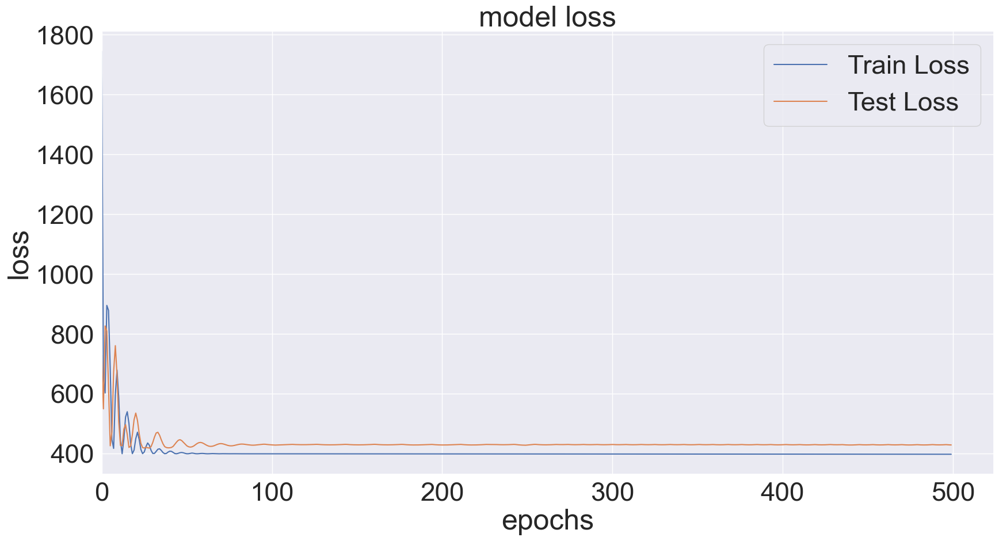

*************** Métricas ***************
MAE 475.35240625000006
MSE 695123.6913400835
RMSE 833.7407818621346
R2 -0.0040968308138986664


D:\programas\conda\envs\fiveStep\lib\site-packages\numpy\core\_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


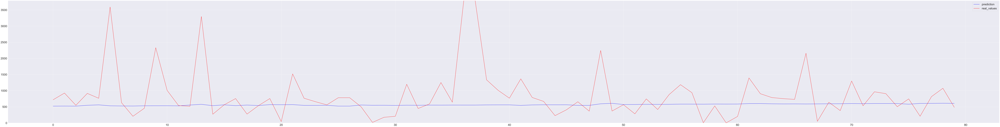

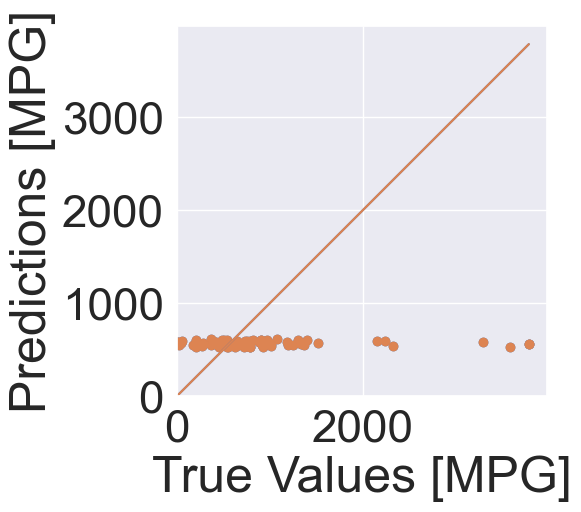

In [16]:

## predecir para un cliente *********************************************
dataOneClient, modelCreatedOneClient = regressionModel.runPrediction(df[df.customerId == 14911], features, value)


3/3 [==============================] - 0s 1ms/step


D:\programas\conda\envs\fiveStep\lib\site-packages\numpy\core\_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


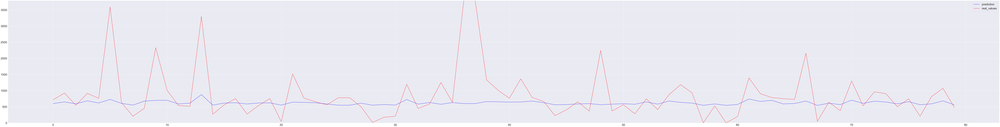

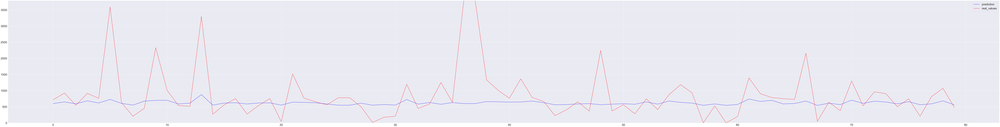

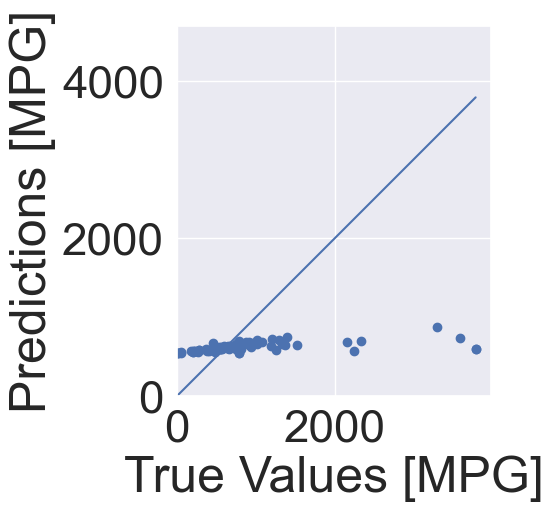

In [17]:
## Usar la predicción de todos los clienes para predecir y comparar para la de un cliente ***************
regressionModel.useModelCreated(dataOneClient, modelCreated)


In [18]:

## Filtramos y Guardamos los datos en un archivo.
dataToExport  = helpers.exportResultPrediction(data)

In [19]:

## Agregamos nombres falsos a los clientes, ya que la base de datos no los contiene
## Máximo datos a exportar son 999 (limitados por los nombres)
dataToExport = dataToExport[0:999]
dataToExport = helpers.loadFakesNames(dataToExport)

In [20]:
## procedemos a calcular los productos mas repetidos en distintas ordenes para cada cliente, ordenamos y solicitamos los 5 
## fundamentales

## Guardamos en la base de datos la base trabajada de los clientes como de los productos
dataToExport.to_csv('dataToExport.csv')

## Calculamos los productos mas vendidos
bestAllProducts = helpers.bestAllProducts(dataSet)
## Exportamos los mejores productos en una tabla
bestAllProducts.to_csv('bestProduct.csv')

In [21]:

## procedemos a ver calcular los productos mas repetidos en distintas ordenes globalmente
helpers.getBestProducts(dataSet)


In [22]:
## Repetimos los productos mas vendidos pero del ultimo més.
helpers.getBestProductsLastMonth(dataSet)

In [23]:

## Exportamos una tabla con las caracteristicas de cada producto.
helpers.exportItemsDetails(dataSet)

In [24]:

compareModels.compareAllModels()


**********  logreg  *************
*************** Métricas ***************
MAE 413.2556647556648
MSE 706470.3998088998
RMSE 840.5179354474834
R2 -0.41820709309549553
**********  gau  *************
*************** Métricas ***************
MAE 396.7805077805078
MSE 570163.1405951406
RMSE 755.0914782959351
R2 -0.19015177668118732
**********  randomForest  *************
*************** Métricas ***************
MAE 227.17199017199016
MSE 3059.8225498225497
RMSE 55.31566278932713
R2 0.070249003837215
**********  treeClassifier  *************
*************** Métricas ***************
MAE 447.4897624897625
MSE 3179.980343980344
RMSE 56.39131443742329
R2 -2.5484173097289933
**********  xgb  *************
*************** Métricas ***************
MAE 212.95140595140595
MSE 340201.7220857221
RMSE 583.2681390970383
R2 0.262812723942237
**********  knei  *************
*************** Métricas ***************
MAE 340.2250887250887
MSE 521599.88875238877
RMSE 722.2187263927658
R2 0.06942502003663076
**